# Loading modules

In [1]:
import numpy as np
import pandas as pd 

In [ ]:
%matplotlib inline # This is a Jupyter Notebook magic command that allows the plots generated by matplotlib to be displayed inline within the notebook.
import warnings # It provides a mechanism to ignore warning messages in the code.
warnings.filterwarnings('ignore') 
from sklearn.preprocessing import OneHotEncoder #It is used for one-hot encoding categorical variables in machine learning models.
from sklearn.model_selection import train_test_split #It splits the dataset into training and testing subsets for model evaluation.
import matplotlib.pyplot as plt #It is a plotting library used to create various types of plots and visualizations.
import seaborn as sns # It is a Python data visualization library based on matplotlib, providing enhanced visual aesthetics and statistical graphics.
import tensorflow as tf #It is a popular open-source library for machine learning and deep learning computations.
import keras #It is a high-level neural networks API written in Python that runs on top of TensorFlow, Theano, or CNTK.
from keras.layers import Conv2D #It represents a 2-dimensional convolutional layer in a neural network
from keras.models import Sequential # It is a linear stack of neural network layers in Keras.
from keras.layers import MaxPool2D #It represents a 2-dimensional max pooling layer in a neural network.
from keras.layers import Flatten #It is used to flatten the input into a 1D array for feeding into a fully connected layer.
from keras.layers import Dense # It represents a fully connected layer in a neural network.
from keras.models import Model #It is a class used to build a custom model in Keras by specifying the input and output layers.
from keras.preprocessing.image import ImageDataGenerator # It generates batches of augmented image data for training neural networks.
from sklearn.metrics import confusion_matrix #It computes the confusion matrix to evaluate the performance of a classification model.
from sklearn.metrics import accuracy_score #It calculates the accuracy score to evaluate the performance of a classification model
import cv2 #It is an OpenCV library used for image processing and computer vision tasks.
import re #It provides regular expression matching operations in Python.
import random #It provides functions for generating random numbers and sequences.
random.seed(0) #It provides functions for generating random numbers and sequences.
np.random.seed(0)

# Plotting some images

Text(0.5, 1.0, 'wheat')

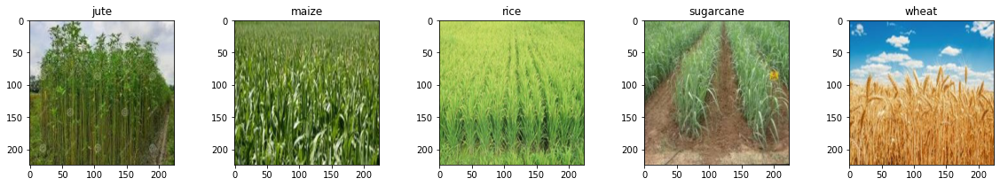

In [ ]:
wheat = plt.imread("/kaggle/input/agriculture-crop-images/kag2/wheat/wheat0004a.jpeg")
jute = plt.imread("/kaggle/input/agriculture-crop-images/kag2/jute/jute005a.jpeg")
cane = plt.imread("/kaggle/input/agriculture-crop-images/kag2/sugarcane/sugarcane0010arot.jpeg")
rice = plt.imread("/kaggle/input/agriculture-crop-images/kag2/rice/rice032ahs.jpeg")
maize = plt.imread("/kaggle/input/agriculture-crop-images/kag2/maize/maize003a.jpeg")
plt.figure(figsize=(20,3))
plt.subplot(1,5,1)
plt.imshow(jute)
plt.title("jute")
plt.subplot(1,5,2)
plt.imshow(maize)
plt.title("maize")
plt.subplot(1,5,3)
plt.imshow(rice)
plt.title("rice")
plt.subplot(1,5,4)
plt.imshow(cane)
plt.title("sugarcane")
plt.subplot(1,5,5)
plt.imshow(wheat)
plt.title("wheat")

#This code snippet reads and displays images of different crop types (jute, maize, rice, sugarcane, wheat) using matplotlib. 
# The images are arranged in a row using subplots, each with its corresponding title.

# Converting to training and testing data

In [ ]:
jutepath = "../input/agriculture-crop-images/kag2/jute"
maizepath = "../input/agriculture-crop-images/kag2/maize"
ricepath = "../input/agriculture-crop-images/kag2/rice"
sugarcanepath = "../input/agriculture-crop-images/kag2/sugarcane"
wheatpath = "../input/agriculture-crop-images/kag2/wheat"

jutefilename = os.listdir(jutepath)
maizefilename = os.listdir(maizepath)
ricefilename = os.listdir(ricepath)
sugarcanefilename = os.listdir(sugarcanepath)
wheatfilename = os.listdir(wheatpath)

X= []

#In these lines of code, the paths to directories containing images of different crop types (jute, maize, rice, sugarcane, wheat) are assigned to respective variables. 
# The os.listdir() function is then used to obtain a list of filenames in each directory. An empty list X is initialized to store the data.

In [ ]:
for fname in jutefilename:
    X.append([os.path.join(jutepath,fname),0])
for fname in maizefilename:
    X.append([os.path.join(maizepath,fname),1])
for fname in ricefilename:
    X.append([os.path.join(ricepath,fname),2])
for fname in sugarcanefilename:
    X.append([os.path.join(sugarcanepath,fname),3]) 
for fname in wheatfilename:
    X.append([os.path.join(wheatpath,fname),4])  
X = pd.DataFrame(X,columns = ['path','labels'])    

#In these lines of code, the filenames and corresponding labels are appended to the X list. 
# The os.path.join() function is used to create the full path of each image file by joining the directory path and the filename. 
# Finally, the data is converted into a pandas DataFrame with columns named 'path' and 'labels'.

In [ ]:
X.head()

,path,labels
0,../input/agriculture-crop-images/kag2/jute/jut...,0
1,../input/agriculture-crop-images/kag2/jute/jut...,0
2,../input/agriculture-crop-images/kag2/jute/jut...,0
3,../input/agriculture-crop-images/kag2/jute/jut...,0
4,../input/agriculture-crop-images/kag2/jute/jut...,0


In [ ]:

ohencoder = OneHotEncoder(handle_unknown='ignore',sparse=False)
ohlabel = pd.DataFrame(ohencoder.fit_transform(X[['labels']]),dtype = 'float64',columns = ['label0','label1','label2','label3','label4'])
label_X = X.copy()
X = pd.concat([X,ohlabel],axis = 1)
new_X = X.drop(['labels'],axis = 1)

#In these lines of code, a OneHotEncoder object is created with the handle_unknown parameter set to 'ignore'. 
# The encoder is then used to transform the 'labels' column of the DataFrame X into a one-hot encoded representation, 
# resulting in a new DataFrame ohlabel. The original DataFrame X is concatenated with ohlabel to include the one-hot encoded labels, 
# and a new DataFrame new_X is created by dropping the original 'labels' column.

In [ ]:
train,test = train_test_split(new_X,test_size=0.2,random_state=32,shuffle = True)

#In these lines of code, the train_test_split function is used to split the new_X DataFrame into training and testing subsets. 
# The test_size parameter specifies the proportion of the dataset to be assigned to the test set, 
# and the random_state parameter sets a seed value for random shuffling to ensure reproducibility. 
# The resulting subsets are assigned to the variables train and test.

In [ ]:
X_train = train['path'].values
y_train = train.drop(['path'],axis=1).values
X_test = test['path'].values
y_test = test.drop(['path'],axis=1).values

In [ ]:
def deep_pipeline(data):
    flat = []
    for i in data:
        img = plt.imread(i)
        img = img/255.
        flat.append(img)
    flat =  np.array(flat)    
    flat = flat.reshape(-1,224,224,3)       
    return flat
    
    #The deep_pipeline function takes a list of image paths as input. 
    # It reads each image using plt.imread(), normalizes the pixel values to be between 0 and 1, and appends them to the flat list. 
    # The flat list is then converted to a NumPy array and reshaped to have dimensions (-1, 224, 224, 3) representing the batch size, 
    # height, width, and channels of the images. 
    # Finally, the reshaped array is returned.

In [ ]:
dx_train = deep_pipeline(X_train)
dx_test = deep_pipeline(X_test)

# Model training

In [ ]:
keras.backend.clear_session()
vgg = keras.applications.VGG19(input_shape=(224,224,3),include_top=False,weights = 'imagenet',pooling='avg')
vgg.trainable = False
vggmodel = keras.Sequential([vgg
                         ,Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(5,activation='softmax')])

vggmodel.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics=['accuracy'])
vggmodel.summary()

#In these lines of code, the Keras backend session is cleared using keras.backend.clear_session() to reset any existing models or layers.
# A VGG19 model is then created using keras.applications.VGG19, with input shape (224, 224, 3), excluding the top (fully connected) layers, and pre-trained weights from the 'imagenet' dataset. 
# The VGG19 model is set as non-trainable.
# A new sequential model vggmodel is created by adding the VGG19 model as the first layer, followed by four dense layers with 1000 units each and 'tanh' activation. 
# The final output layer has 5 units with 'softmax' activation.
# The model is compiled with the 'adam' optimizer, 'categorical_crossentropy' loss function, and 'accuracy' metric. 
# A summary of the model is printed using vggmodel.summary(), showing the model architecture and the number of trainable parameters.

80142336/80134624 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 512)               20024384  
_________________________________________________________________
dense (Dense)                (None, 1000)              513000    
_________________________________________________________________
dense_1 (Dense)              (None, 1000)              1001000   
_________________________________________________________________
dense_2 (Dense)              (None, 1000)              1001000   
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 5005      
Total params: 22,544,389
Trainable params: 2,520,005
Non-trainable params: 20,024,384
_________________________________________________________________


In [ ]:
hist = vggmodel.fit(dx_train,y_train,epochs=50,validation_split=0.3,batch_size=16)

Epoch 1/50
28/28 [==============================] - 3s 109ms/step - loss: 3.0200 - accuracy: 0.2780 - val_loss: 1.3661 - val_accuracy: 0.4792
Epoch 2/50
28/28 [==============================] - 2s 76ms/step - loss: 1.2730 - accuracy: 0.5157 - val_loss: 1.2540 - val_accuracy: 0.5417
Epoch 3/50
28/28 [==============================] - 2s 77ms/step - loss: 1.0431 - accuracy: 0.5673 - val_loss: 1.2434 - val_accuracy: 0.5156
Epoch 4/50
28/28 [==============================] - 2s 76ms/step - loss: 0.8738 - accuracy: 0.6839 - val_loss: 1.1318 - val_accuracy: 0.5260
Epoch 5/50
28/28 [==============================] - 2s 77ms/step - loss: 0.7871 - accuracy: 0.6996 - val_loss: 0.6435 - val_accuracy: 0.7500
Epoch 6/50
28/28 [==============================] - 2s 76ms/step - loss: 0.7050 - accuracy: 0.7220 - val_loss: 0.6128 - val_accuracy: 0.7552
Epoch 7/50
28/28 [==============================] - 2s 76ms/step - loss: 0.6688 - accuracy: 0.7803 - val_loss: 0.8669 - val_accuracy: 0.6406
Epoch 8/50
2

(0.0, 4.0)

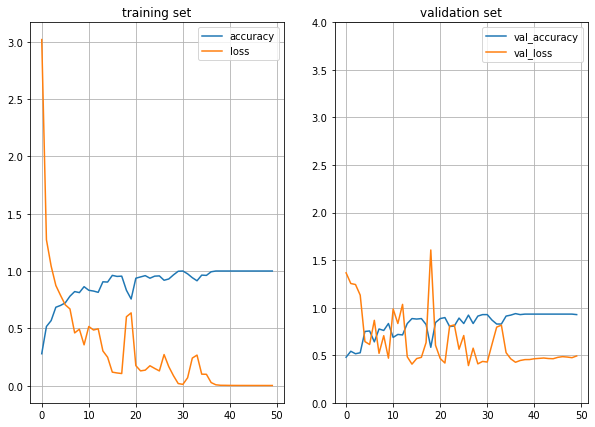

In [ ]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.plot(hist.history['accuracy'],label='accuracy')
plt.plot(hist.history['loss'],label='loss')
plt.legend()
plt.title("training set")
plt.grid()
plt.subplot(1,2,2)
plt.plot(hist.history['val_accuracy'],label='val_accuracy')
plt.plot(hist.history['val_loss'],label='val_loss')
plt.legend()
plt.title("validation set")
plt.grid()
plt.ylim((0,4))

# Test set accuracy

In [ ]:
score = vggmodel.evaluate(dx_test,y_test)
print("accuracy: ", score[1])

5/5 [==============================] - 0s 75ms/step - loss: 0.2725 - accuracy: 0.9375
accuracy:  0.9375


In [ ]:
pred = vggmodel.predict(dx_test)
prediction = np.argmax(pred,axis=1)
true = np.argmax(y_test,axis=1)
best_prob = [pred[num,:][i] for num,i in enumerate(prediction)]

# Confusion matrix

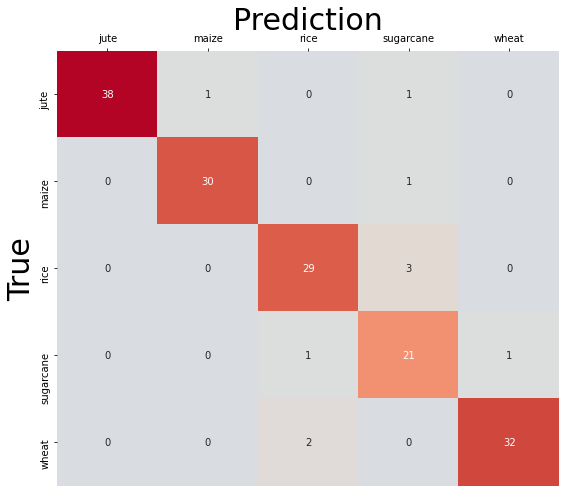

In [ ]:
plt.figure(figsize = (9,8))
class_label = ['jute','maize','rice','sugarcane','wheat']
fig = sns.heatmap(confusion_matrix(true,prediction),cmap= "coolwarm",annot=True,vmin=0,cbar = False,
            center = True,xticklabels=class_label,yticklabels=class_label)
fig.set_xlabel("Prediction",fontsize=30)
fig.xaxis.set_label_position('top')
fig.set_ylabel("True",fontsize=30)
fig.xaxis.tick_top()

# Pipelining

In [ ]:
def deepmodelpipeline(imagepath,model = vggmodel,label=[-1]):
    pdict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    pred_x = deep_pipeline([imagepath])
    prediction = model.predict(pred_x)
    pred = np.argmax(prediction[0])
    plt.imshow(plt.imread(imagepath))
    if (label[0]!=-1):
        plt.title("prediction : {0} % {1:.2f} \ntrue        : {2}".format(pdict[pred],prediction[0,pred]*100,pdict[np.argmax(label)]))
    else:
        plt.title("prediction : {0}, % {1:.2f}".format(pdict[pred],prediction[0,pred]*100))

#The deepmodelpipeline function takes an image path, a model (defaulting to vggmodel), and an optional label as input. 
# It performs the following steps:
# It uses the deep_pipeline function to preprocess the image and obtain the processed image data.
# The model predicts the class probabilities for the processed image data.
# The predicted class index is obtained using np.argmax.
# The image is displayed using plt.imshow.
# If a label is provided, the predicted class, its corresponding probability, and the true label are displayed in the plot title.
# If no label is provided, only the predicted class and its corresponding probability are displayed in the plot title.

# Prediction on sample images

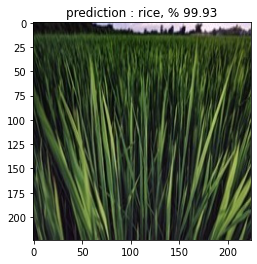

In [ ]:
deepmodelpipeline('/kaggle/input/agriculture-crop-images/kag2/rice/rice024ahs.jpeg')

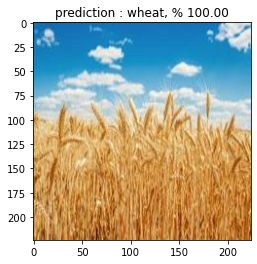

In [ ]:
deepmodelpipeline('../input/agriculture-crop-images/kag2/wheat/wheat0004a.jpeg')

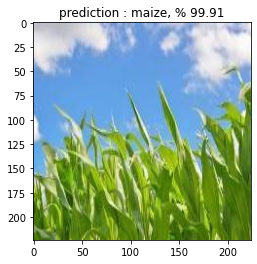

In [ ]:
deepmodelpipeline("../input/agriculture-crop-images/kag2/maize/maize008ahf.jpeg")

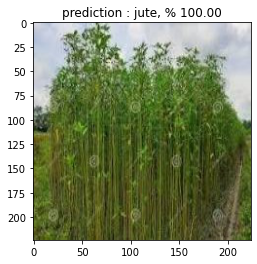

In [ ]:
deepmodelpipeline("../input/agriculture-crop-images/kag2/jute/jute005a.jpeg")

# Prediction on test images

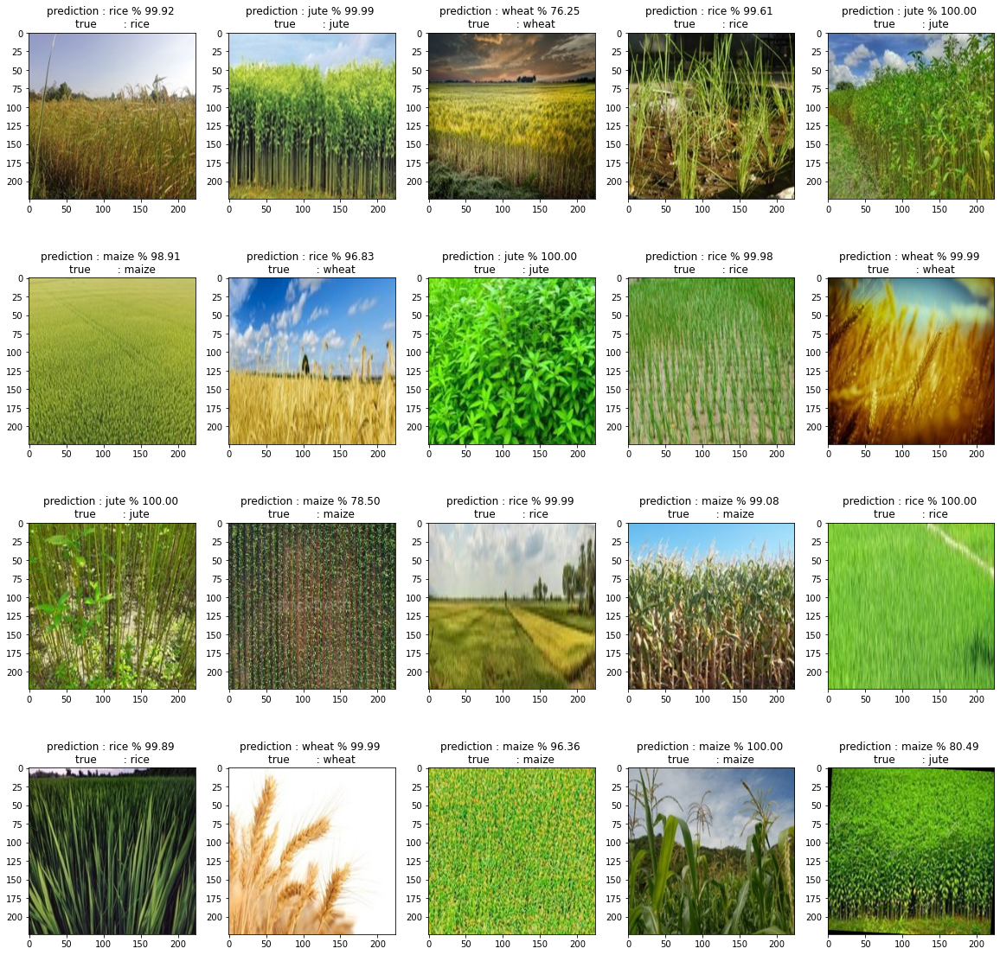

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[0:20]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num])

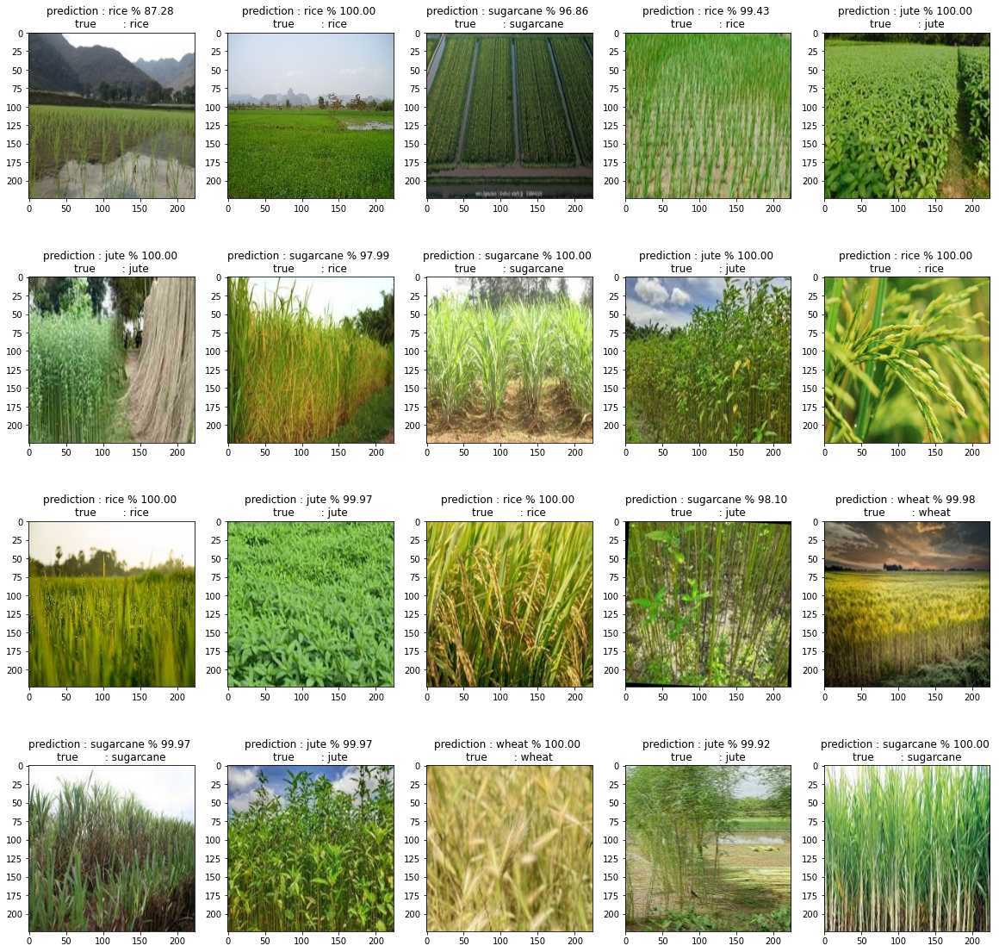

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[20:40]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+20])

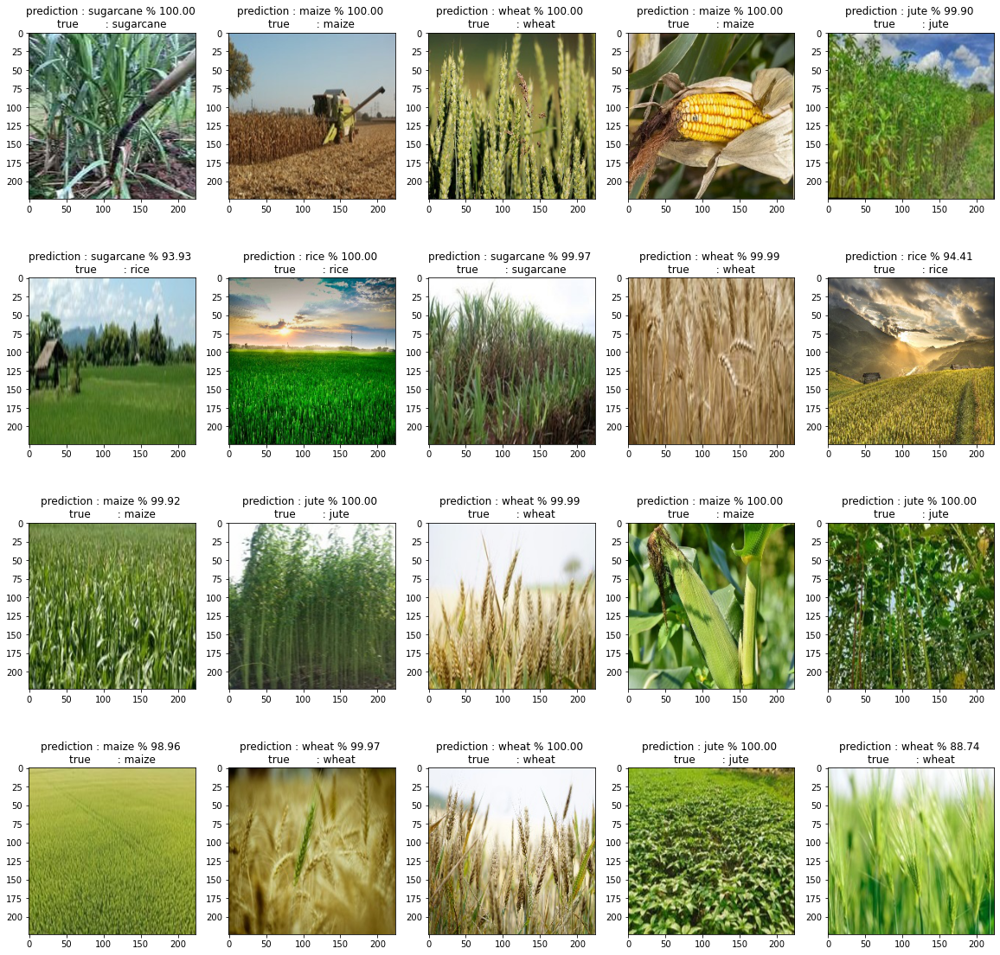

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[40:60]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+40])

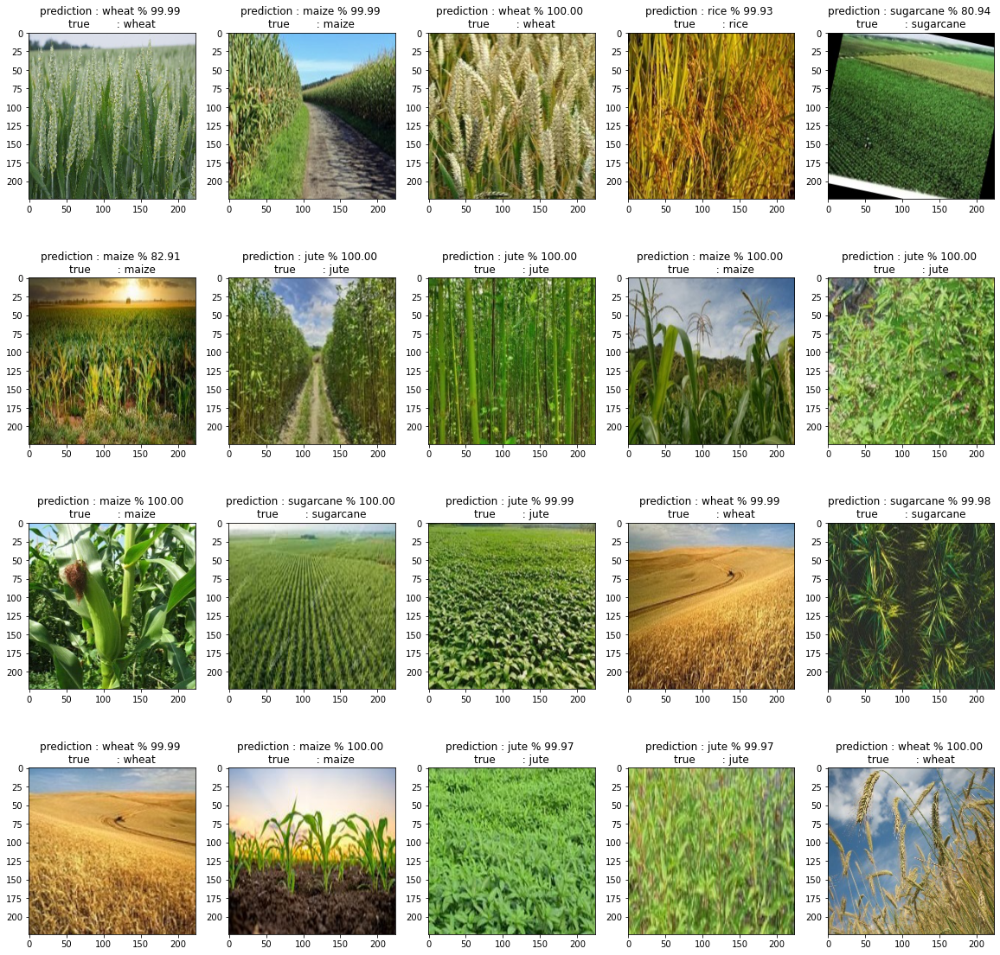

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[100:120]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+100])

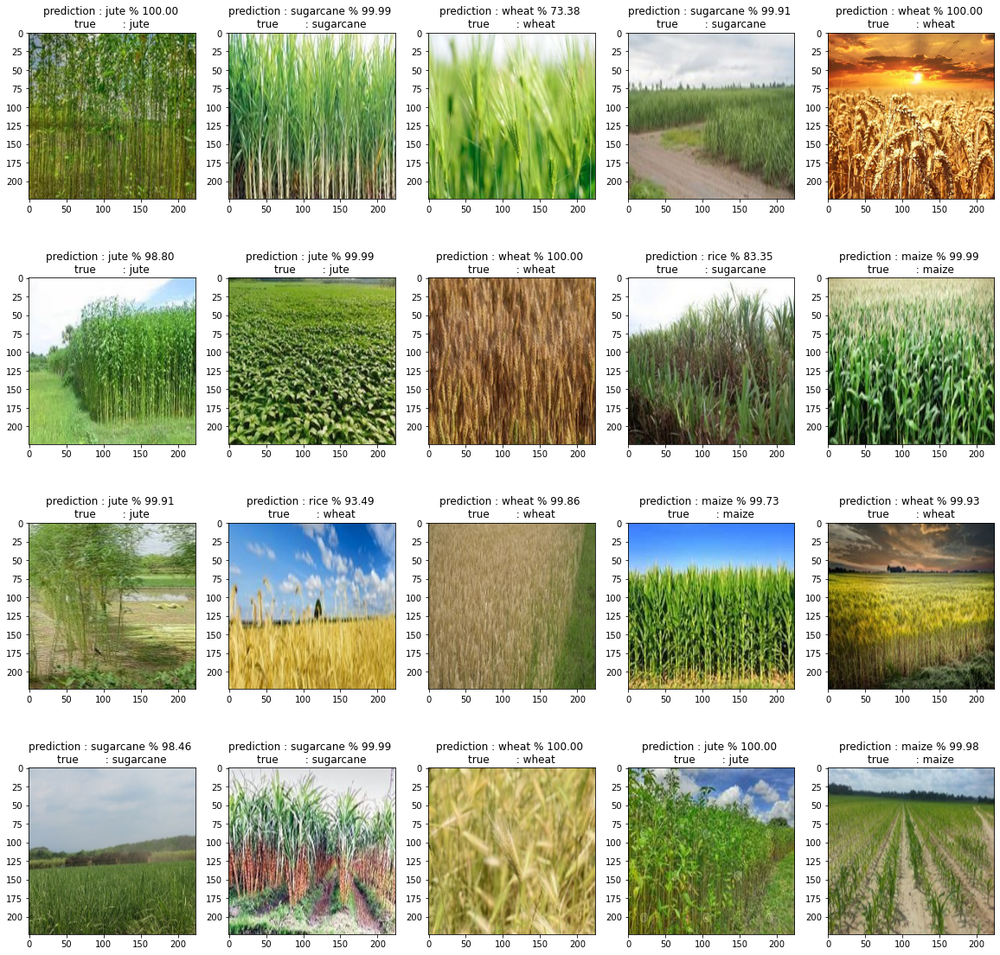

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[140:160]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+140])